In [1]:
import os
import sys
module_path = os.path.abspath(os.path.join('..'))
if module_path not in sys.path:
    sys.path.append(module_path)
    
import numpy as np
import scanpy as sc
import pandas as pd
import torch
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import classification_report

sc.settings.set_figure_params(dpi=200, frameon=False)
sc.set_figure_params(dpi=200)
torch.set_printoptions(precision=3, sci_mode=False, edgeitems=7)

def set_axis_style(ax, labels):
    ax.get_xaxis().set_tick_params(direction='out')
    ax.xaxis.set_ticks_position('bottom')
    ax.set_xticks(np.arange(1, len(labels) + 1))
    ax.set_xticklabels(labels)
    ax.set_xlim(0.25, len(labels) + 0.75)
    ax.set_xlabel('Sample name')
    
%load_ext autoreload
%autoreload 2

In [2]:
import scarches
from scarches.dataset import remove_sparsity
from lataq.models import TRANVAE

# Create reference data without Delta cells and query data with Delta cells

In [3]:
adata = sc.read(
    f'../data/pbmc.h5ad'
)
adata

AnnData object with n_obs × n_vars = 32484 × 4000
    obs: 'study', 'condition', 'cell_type', 'pred_label', 'pred_score'
    obsm: 'X_seurat', 'X_symphony'

In [ ]:
condition_key = "condition"
cell_type_keys = ["cell_type"]
remove_cts = ["Erythrocytes"]
query = ["Oetjen_P",]

In [4]:
adata_plot = adata.copy()
sc.pp.normalize_total(adata_plot)
sc.pp.log1p(adata_plot)
sc.pp.pca(adata_plot)
sc.pp.neighbors(adata_plot)
sc.tl.umap(adata_plot)

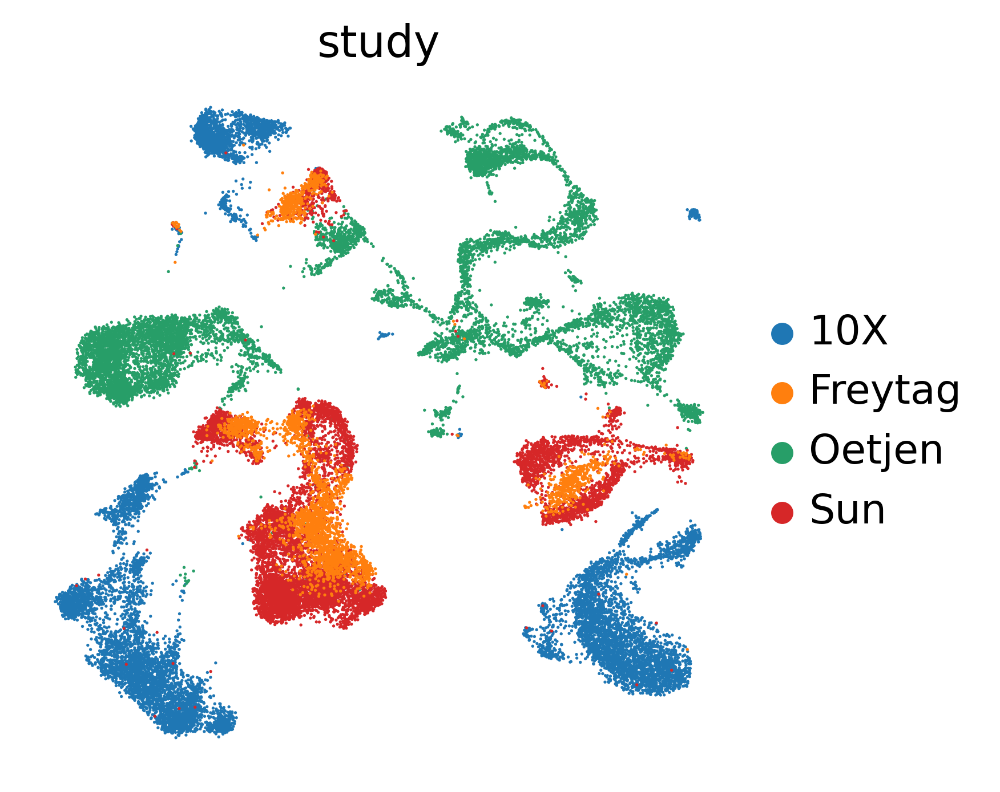

In [5]:
sc.pl.umap(adata_plot, color='study', frameon=False)

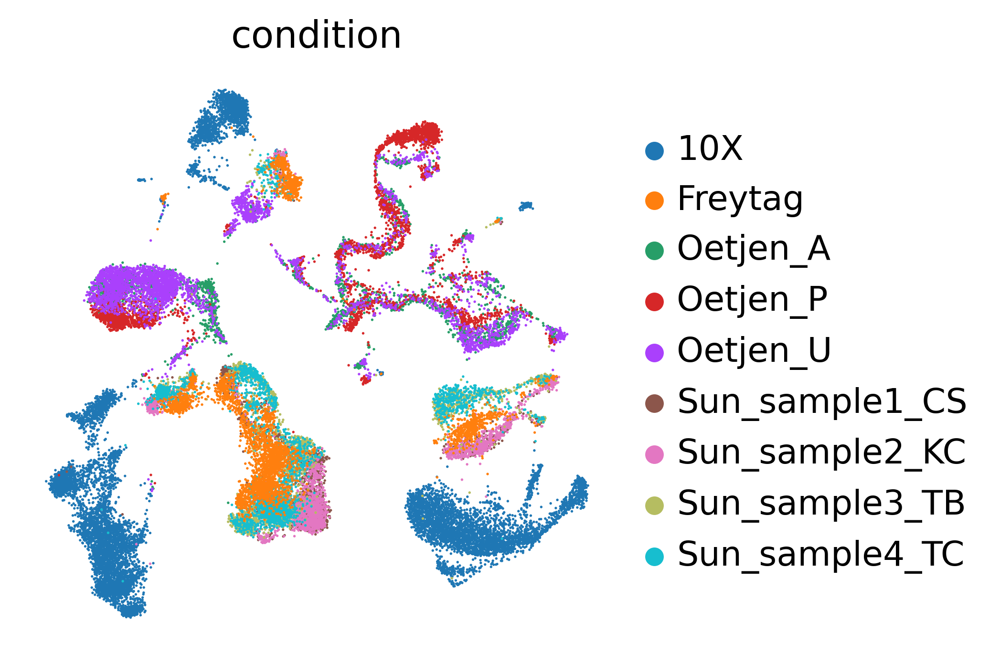

In [6]:
sc.pl.umap(adata_plot, color='condition', frameon=False)

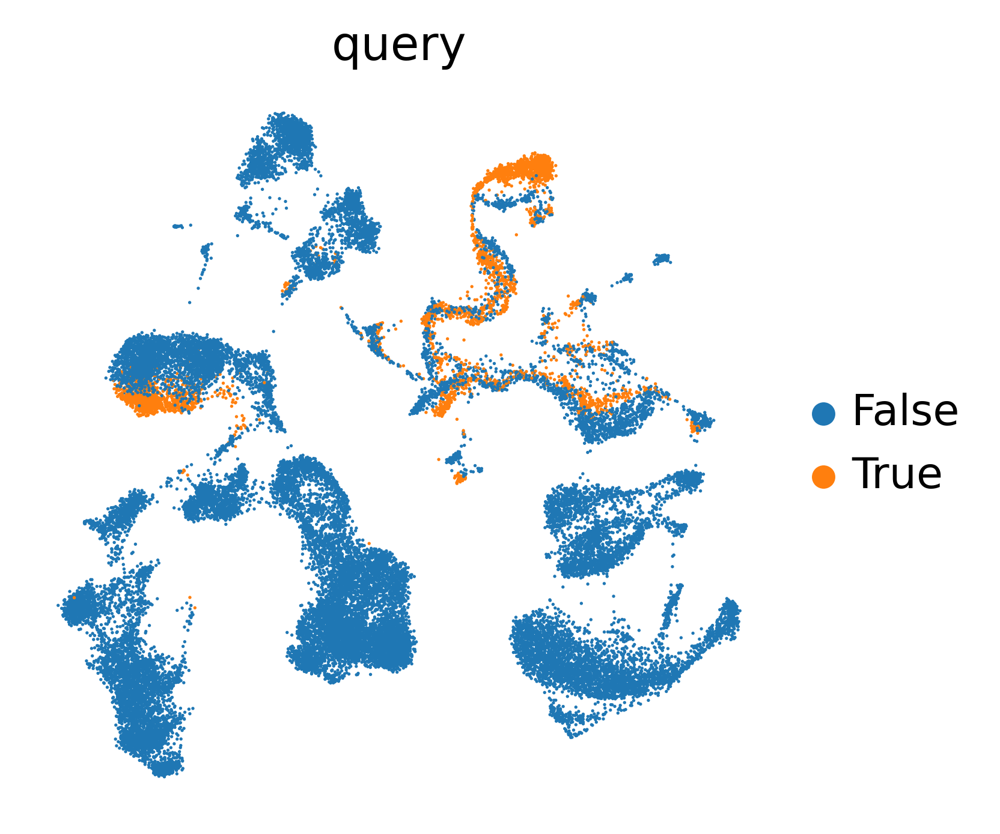

In [73]:
adata_plot.obs['query'] = adata_plot.obs['condition'].isin(query).astype('category')
sc.pl.umap(adata_plot, color='query', frameon=False)

In [7]:
pd.crosstab(adata.obs['condition'], adata.obs['cell_type'])

cell_type,CD4+ T cells,CD8+ T cells,CD10+ B cells,CD14+ Monocytes,CD16+ Monocytes,CD20+ B cells,Erythrocytes,Erythroid progenitors,HSPCs,Megakaryocyte progenitors,Monocyte progenitors,Monocyte-derived dendritic cells,NK cells,NKT cells,Plasma cells,Plasmacytoid dendritic cells
condition,,,,,,,,,,,,,,,,
10X,2937,350,0,3388,364,1546,0,0,28,21,0,182,756,1056,18,81
Freytag,1238,270,0,452,25,427,0,0,0,16,0,0,476,432,0,11
Oetjen_A,577,93,91,350,61,43,186,112,227,72,183,89,26,389,33,54
Oetjen_P,295,639,41,263,26,31,1219,249,119,71,109,60,0,62,40,41
Oetjen_U,1652,253,75,384,78,417,97,102,99,76,136,65,63,157,38,38
Sun_sample1_CS,1054,0,0,222,24,59,0,0,0,6,0,25,99,236,0,0
Sun_sample2_KC,1162,76,0,522,119,143,0,0,0,8,0,0,191,53,0,7
Sun_sample3_TB,1052,354,0,372,91,81,0,0,0,0,0,36,219,181,0,17
Sun_sample4_TC,1044,148,0,385,37,126,0,0,0,0,0,21,464,179,0,16


In [9]:
cell_type_key = cell_type_keys[-1]
adata = remove_sparsity(adata)
ref_adata = adata[~adata.obs['condition'].isin(query)].copy()
ref_adata = ref_adata[~ref_adata.obs.cell_type.isin(remove_cts)].copy()
query_adata = adata[adata.obs['condition'].isin(query)].copy()
adata = ref_adata.concatenate(query_adata)

#### Full Data processed

In [10]:
cts = adata.obs[cell_type_key].unique().tolist()
print(adata)
for celltype in cts:
    print(celltype, len(adata[adata.obs.cell_type.isin([celltype])]))

AnnData object with n_obs × n_vars = 32201 × 4000
    obs: 'study', 'condition', 'cell_type', 'pred_label', 'pred_score', 'batch'
    obsm: 'X_seurat', 'X_symphony'
CD4+ T cells 11011
Monocyte-derived dendritic cells 478
CD14+ Monocytes 6338
NK cells 2294
CD20+ B cells 2873
NKT cells 2745
CD8+ T cells 2183
Plasmacytoid dendritic cells 265
CD16+ Monocytes 825
Megakaryocyte progenitors 270
HSPCs 473
Plasma cells 129
CD10+ B cells 207
Monocyte progenitors 428
Erythroid progenitors 463
Erythrocytes 1219


#### Reference Data

In [11]:
cts = ref_adata.obs[cell_type_key].unique().tolist()
print(ref_adata)
for celltype in cts:
    print(celltype, len(ref_adata[ref_adata.obs.cell_type.isin([celltype])]))

AnnData object with n_obs × n_vars = 28936 × 4000
    obs: 'study', 'condition', 'cell_type', 'pred_label', 'pred_score'
    obsm: 'X_seurat', 'X_symphony'
CD4+ T cells 10716
Monocyte-derived dendritic cells 418
CD14+ Monocytes 6075
NK cells 2294
CD20+ B cells 2842
NKT cells 2683
CD8+ T cells 1544
Plasmacytoid dendritic cells 224
CD16+ Monocytes 799
Megakaryocyte progenitors 199
HSPCs 354
Plasma cells 89
CD10+ B cells 166
Monocyte progenitors 319
Erythroid progenitors 214


#### Query Data

In [12]:
cts = query_adata.obs[cell_type_key].unique().tolist()
print(query_adata)
for celltype in cts:
    print(celltype, len(query_adata[query_adata.obs.cell_type.isin([celltype])]))

AnnData object with n_obs × n_vars = 3265 × 4000
    obs: 'study', 'condition', 'cell_type', 'pred_label', 'pred_score'
    obsm: 'X_seurat', 'X_symphony'
CD8+ T cells 639
CD4+ T cells 295
Erythrocytes 1219
Megakaryocyte progenitors 71
Plasmacytoid dendritic cells 41
CD20+ B cells 31
CD10+ B cells 41
Erythroid progenitors 249
CD14+ Monocytes 263
NKT cells 62
HSPCs 119
Plasma cells 40
Monocyte progenitors 109
Monocyte-derived dendritic cells 60
CD16+ Monocytes 26


# Supervised Reference Training (100% labels used)

In [13]:
tranvae_ref = TRANVAE(
    adata=ref_adata,
    condition_key=condition_key,
    cell_type_keys=cell_type_keys,
    hidden_layer_sizes=[128, 128, 128],
)


INITIALIZING NEW NETWORK..............
Encoder Architecture:
	Input Layer in, out and cond: 4000 128 8
	Hidden Layer 1 in/out: 128 128
	Hidden Layer 2 in/out: 128 128
	Mean/Var Layer in/out: 128 10
Decoder Architecture:
	First Layer in, out and cond:  10 128 8
	Hidden Layer 1 in/out: 128 128
	Hidden Layer 2 in/out: 128 128
	Output Layer in/out:  128 4000 



In [14]:
early_stopping_kwargs = {
    "early_stopping_metric": "val_landmark_loss",
    "mode": "min",
    "threshold": 0,
    "patience": 20,
    "reduce_lr": True,
    "lr_patience": 13,
    "lr_factor": 0.1,
}

tranvae_ref.train(
    n_epochs=500,
    early_stopping_kwargs=early_stopping_kwargs,
    pretraining_epochs=400,
    alpha_epoch_anneal=1e3,
    eta=1,
    unlabeled_weight=0.1,
    clustering_res=0.5,
)

 |██████████████████--| 93.8%  - val_loss: 1317.4248949134 - val_trvae_loss: 1315.1299358865 - val_landmark_loss: 2.2949542792 - val_labeled_loss: 2.2949542792
ADJUSTED LR
 |███████████████████-| 95.2%  - val_loss: 1315.8948550017 - val_trvae_loss: 1313.7085438604 - val_landmark_loss: 2.1863033098 - val_labeled_loss: 2.1863033098
Stopping early: no improvement of more than 0 nats in 20 epochs
If the early stopping criterion is too strong, please instantiate it with different parameters in the train method.
Saving best state of network...
Best State was in Epoch 454


# Unsupervised Query Training (0 labels used)

In [15]:
tranvae = TRANVAE.load_query_data(
    adata=query_adata,
    reference_model=tranvae_ref,
    labeled_indices=[],
)


INITIALIZING NEW NETWORK..............
Encoder Architecture:
	Input Layer in, out and cond: 4000 128 9
	Hidden Layer 1 in/out: 128 128
	Hidden Layer 2 in/out: 128 128
	Mean/Var Layer in/out: 128 10
Decoder Architecture:
	First Layer in, out and cond:  10 128 9
	Hidden Layer 1 in/out: 128 128
	Hidden Layer 2 in/out: 128 128
	Output Layer in/out:  128 4000 



In [16]:
early_stopping_kwargs = {
    "early_stopping_metric": "val_loss",
    "mode": "min",
    "threshold": 0,
    "patience": 20,
    "reduce_lr": True,
    "lr_patience": 13,
    "lr_factor": 0.1,
}

tranvae.train(
    n_epochs=500,
    early_stopping_kwargs=early_stopping_kwargs,
    pretraining_epochs=400,
    eta=1,
    unlabeled_weight=0.1,
    weight_decay=0,
    clustering_res=2,
)

Therefore integer value of those labels is set to -1
Therefore integer value of those labels is set to -1
Therefore integer value of those labels is set to -1
Therefore integer value of those labels is set to -1
 |████████████████----| 80.0%  - val_loss: 1430.9308268229 - val_trvae_loss: 1430.9308268229
Initializing unlabeled landmarks with Leiden-Clustering with an unknown number of clusters.
Leiden Clustering succesful. Found 22 clusters.
 |█████████████████---| 88.0%  - val_loss: 1446.0800781250 - val_trvae_loss: 1446.0616861979 - val_landmark_loss: 0.0184040541 - val_unlabeled_loss: 0.1840405415
ADJUSTED LR
 |█████████████████---| 89.4%  - val_loss: 1430.0584309896 - val_trvae_loss: 1430.0417073568 - val_landmark_loss: 0.0167223938 - val_unlabeled_loss: 0.1672239304
Stopping early: no improvement of more than 0 nats in 20 epochs
If the early stopping criterion is too strong, please instantiate it with different parameters in the train method.
Saving best state of network...
Best St

In [17]:
tranvae.save(
    'tmp',
    overwrite=True
)

# Reloading point if trained model already exists

In [192]:
tranvae = TRANVAE.load(
    dir_path='pbmc_model_novel_ct',
    adata=query_adata,
)

AnnData object with n_obs × n_vars = 3265 × 4000
    obs: 'study', 'condition', 'cell_type', 'pred_label', 'pred_score', 'trvae_size_factors', 'trvae_labeled'
    obsm: 'X_seurat', 'X_symphony'

INITIALIZING NEW NETWORK..............
Encoder Architecture:
	Input Layer in, out and cond: 4000 128 9
	Hidden Layer 1 in/out: 128 128
	Hidden Layer 2 in/out: 128 128
	Mean/Var Layer in/out: 128 10
Decoder Architecture:
	First Layer in, out and cond:  10 128 9
	Hidden Layer 1 in/out: 128 128
	Hidden Layer 2 in/out: 128 128
	Output Layer in/out:  128 4000 



# Visualizing resulting adata latent representation and landmarks

#### Unlabeled Query Data accuracy

In [193]:
def detect_threshold(probs, labels):
    candidates = np.linspace(np.min(probs), np.max(probs), 1000)
    accs = []
    for thr in candidates:
        outcome = (probs > thr)
        acc = np.sum((outcome == labels)) / len(outcome)
        accs.append(acc)
    return accs, candidates

In [194]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

In [195]:
def conf_matrix_plot(y_true, y_pred, labels):
    conf_matrix = confusion_matrix(
        y_true=y_true,
        y_pred=y_pred,
        labels=labels,
    )
    conf_matrix_norm = confusion_matrix(
        y_true=y_true,
        y_pred=y_pred,
        labels=labels,
        normalize='true'
    )

    fig, ax = plt.subplots(1, 1, figsize=(10, 10))
    sns.heatmap(
        conf_matrix_norm,
        annot=conf_matrix,
        ax=ax,
        fmt='d',
        xticklabels=labels,
        yticklabels=labels,
    )

/home/icb/carlo.dedonno/anaconda3/envs/lataq_cuda/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/icb/carlo.dedonno/anaconda3/envs/lataq_cuda/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/icb/carlo.dedonno/anaconda3/envs/lataq_cuda/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _wa

                                  precision    recall  f1-score   support

                    CD8+ T cells       0.97      0.15      0.26       639
                    CD4+ T cells       0.34      0.98      0.51       295
                    Erythrocytes       0.00      0.00      0.00      1219
       Megakaryocyte progenitors       0.42      0.73      0.53        71
    Plasmacytoid dendritic cells       0.85      0.95      0.90        41
                   CD20+ B cells       0.71      0.94      0.81        31
                   CD10+ B cells       0.87      0.95      0.91        41
           Erythroid progenitors       0.14      0.76      0.23       249
                 CD14+ Monocytes       0.99      0.62      0.77       263
                       NKT cells       0.80      0.58      0.67        62
                           HSPCs       0.58      0.89      0.70       119
                    Plasma cells       1.00      1.00      1.00        40
            Monocyte progenitors     

<AxesSubplot:xlabel='cell_type_prob'>

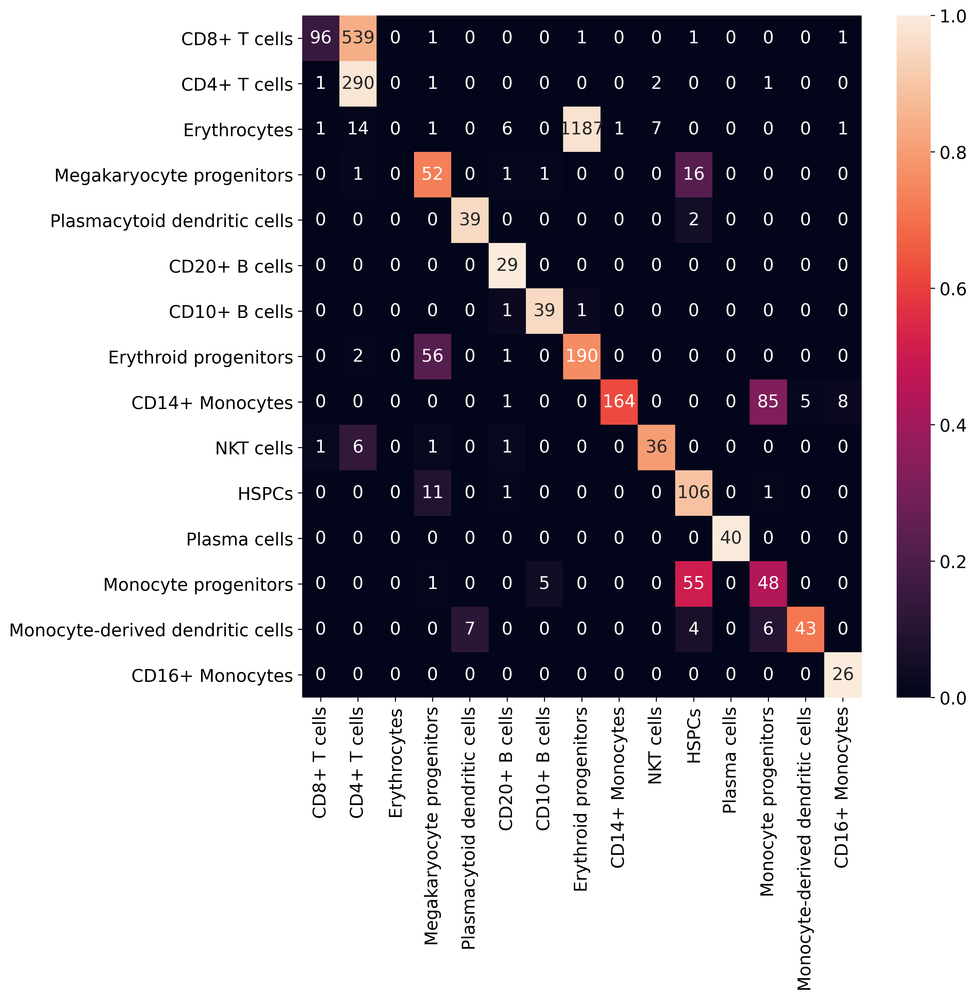

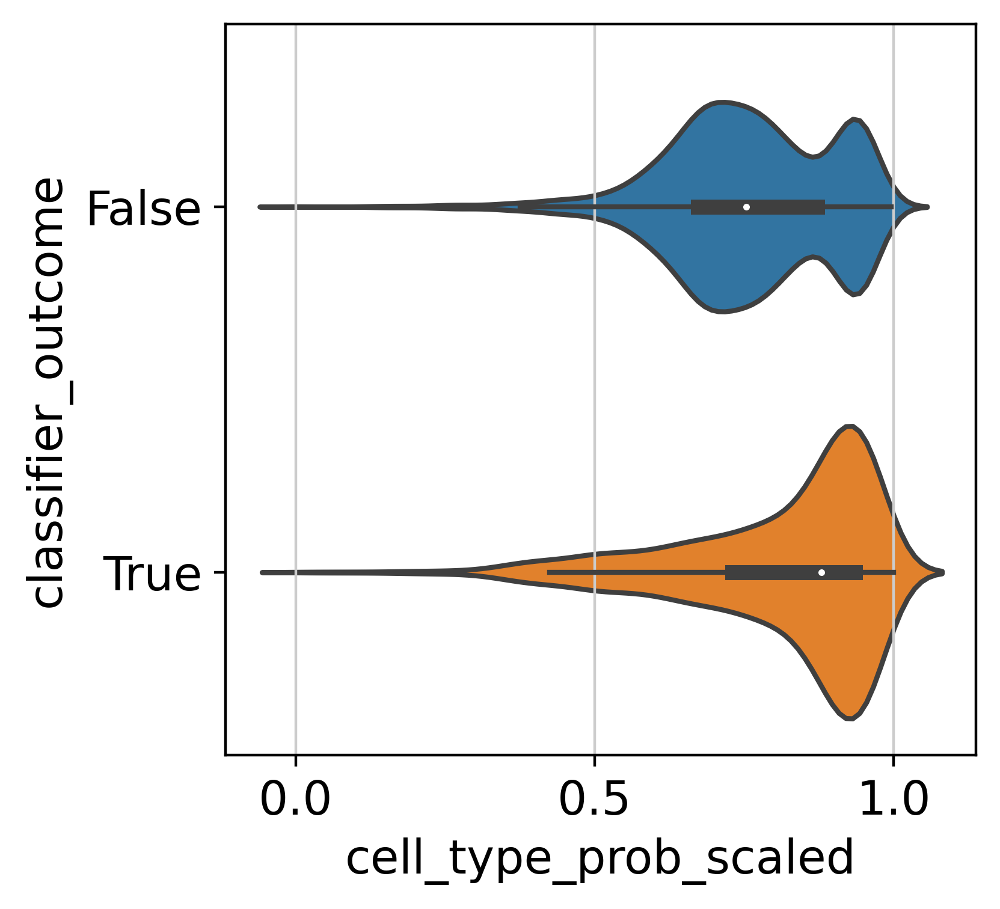

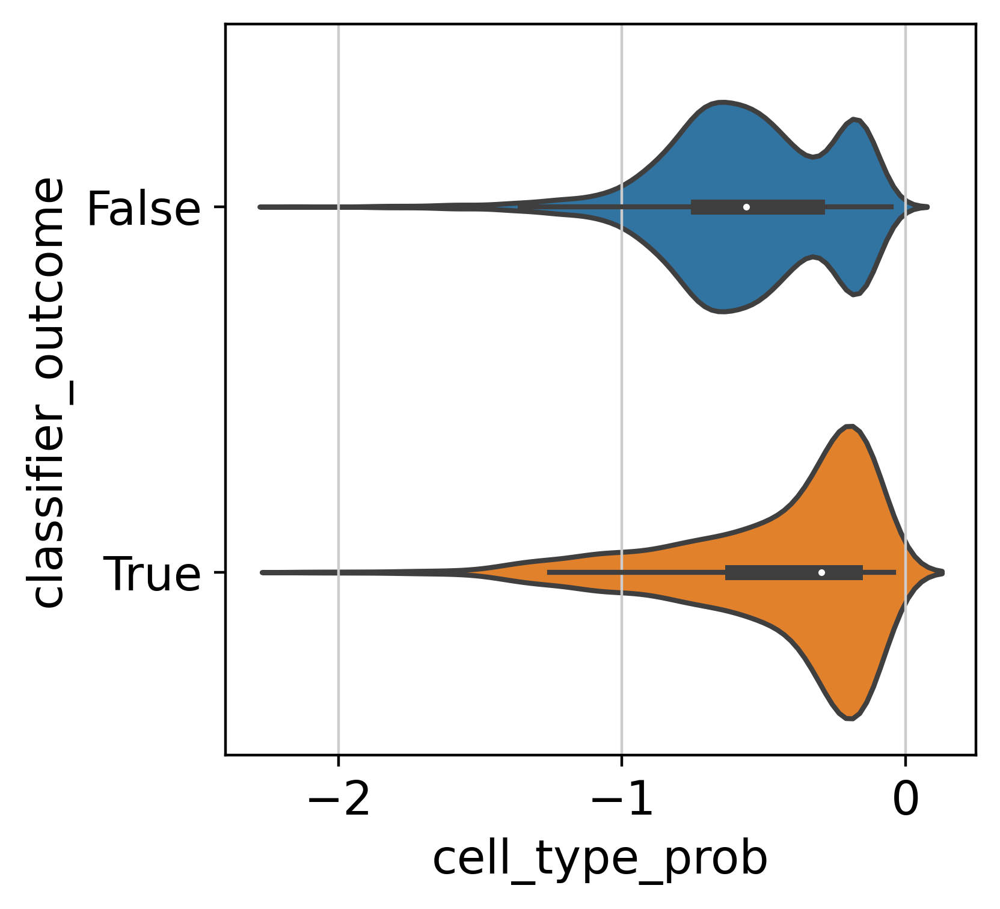

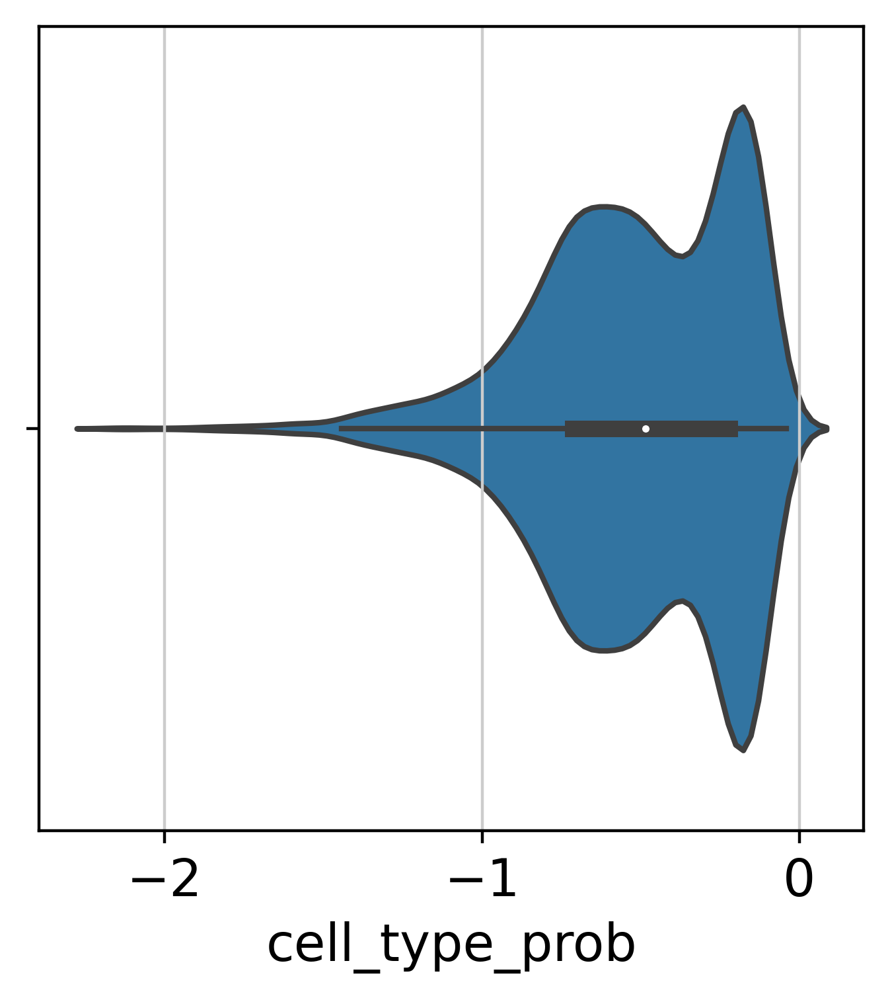

In [196]:
results_dict_q = tranvae.classify(
    metric="dist",
    get_prob=False,
    threshold=-1e10
)

preds_q = results_dict_q[cell_type_key]['preds']
probs_q = results_dict_q[cell_type_key]['probs']
print(classification_report(
    y_true=query_adata.obs[cell_type_key],
    y_pred=preds_q,
    labels=np.array(query_adata.obs[cell_type_key].unique().tolist())
))
conf_matrix_plot(
    y_true=query_adata.obs[cell_type_key],
    y_pred=preds_q,
    labels=np.array(query_adata.obs[cell_type_key].unique().tolist())
)

data_latent = tranvae.get_latent()
adata_latent = sc.AnnData(data_latent)
adata_latent.obs[condition_key] = query_adata.obs[condition_key].tolist()
adata_latent.obs[cell_type_key] = query_adata.obs[cell_type_key].tolist()
adata_latent.obs[f'{cell_type_key}_pred'] = preds_q.tolist()
adata_latent.obs[f'{cell_type_key}_prob'] = probs_q.tolist()
adata_latent.obs[f'classifier_outcome'] = (
    adata_latent.obs[f'{cell_type_key}_pred'] == adata_latent.obs[f'{cell_type_key}']
)
probs_scaled = (probs_q - probs_q.min(axis=0)) / (probs_q.max(axis=0) - probs_q.min(axis=0))
adata_latent.obs[f'{cell_type_key}_prob_scaled'] = probs_scaled

plt.figure()
sns.violinplot(
    x=adata_latent.obs['cell_type_prob_scaled'], 
    y=adata_latent.obs['classifier_outcome'].astype('category')
)
plt.figure()
sns.violinplot(
    x=adata_latent.obs['cell_type_prob'], 
    y=adata_latent.obs['classifier_outcome'].astype('category')
)
plt.figure()
sns.violinplot(
    x=adata_latent.obs['cell_type_prob'], 
)

(0.0, 1.0)

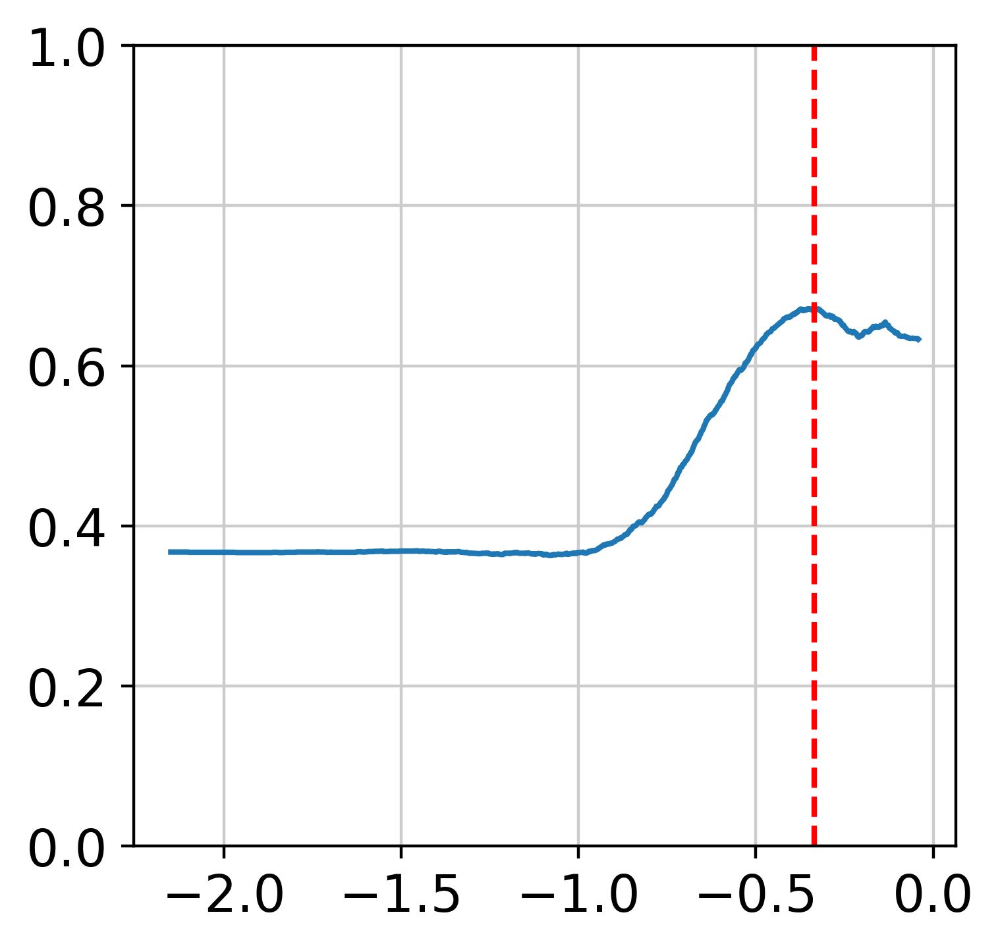

In [197]:
accs, candidates = detect_threshold(adata_latent.obs['cell_type_prob'], adata_latent.obs['classifier_outcome'])
candidates[np.argmax(accs)]
plt.plot(candidates, accs)
plt.axvline(candidates[np.argmax(accs)], color='r', linestyle='--')
plt.ylim([0, 1])

['CD4+ T cells' 'CD4+ T cells' 'CD4+ T cells' 'CD4+ T cells'
 'CD4+ T cells' 'CD4+ T cells' 'Erythroid progenitors' ...
 'CD16+ Monocytes' 'Erythroid progenitors' 'Erythroid progenitors'
 'Erythroid progenitors' 'CD4+ T cells' 'CD14+ Monocytes'
 'Erythroid progenitors']
                                  precision    recall  f1-score   support

                    CD8+ T cells       0.96      0.14      0.25       639
                    CD4+ T cells       0.34      0.98      0.50       295
                    Erythrocytes       0.00      0.00      0.00      1219
       Megakaryocyte progenitors       0.41      0.73      0.52        71
    Plasmacytoid dendritic cells       0.88      0.90      0.89        41
                   CD20+ B cells       0.75      0.97      0.85        31
                   CD10+ B cells       0.87      0.95      0.91        41
           Erythroid progenitors       0.14      0.76      0.23       249
                 CD14+ Monocytes       0.99      0.62      0.7

/home/icb/carlo.dedonno/anaconda3/envs/lataq_cuda/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/icb/carlo.dedonno/anaconda3/envs/lataq_cuda/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/icb/carlo.dedonno/anaconda3/envs/lataq_cuda/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _wa

<AxesSubplot:xlabel='cell_type_prob'>

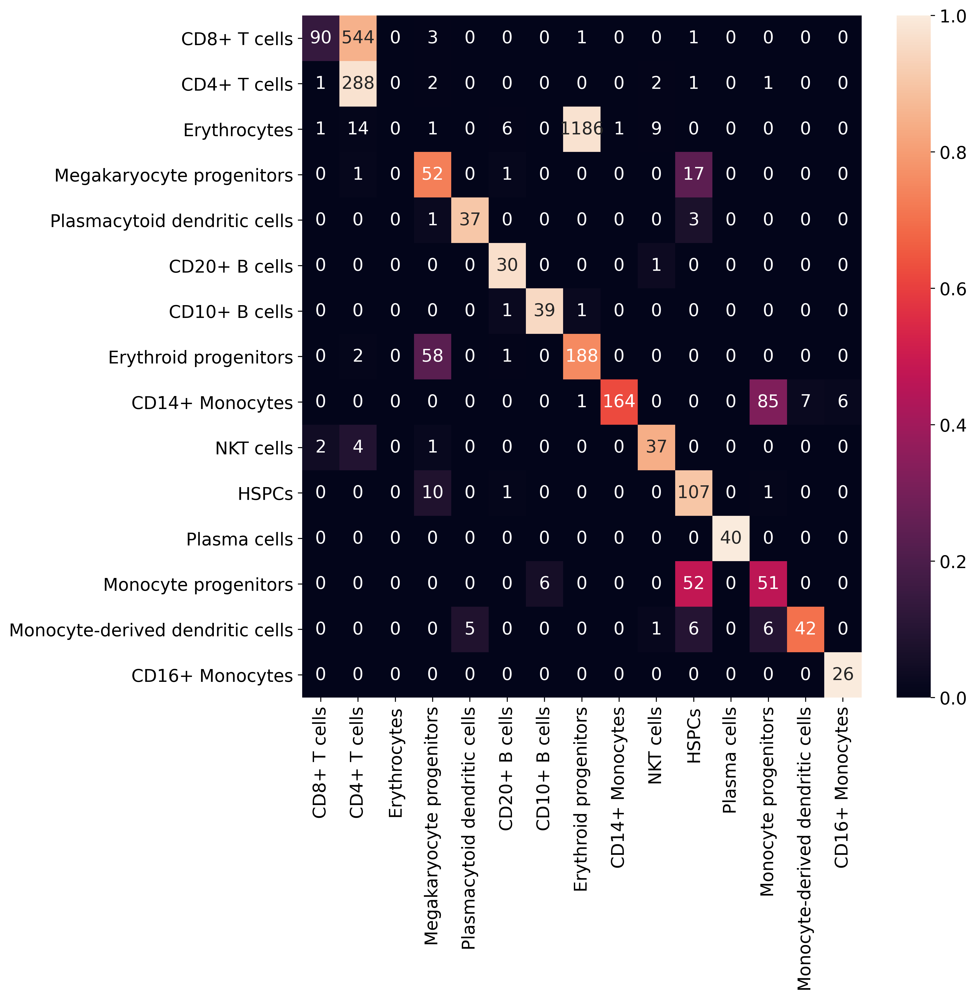

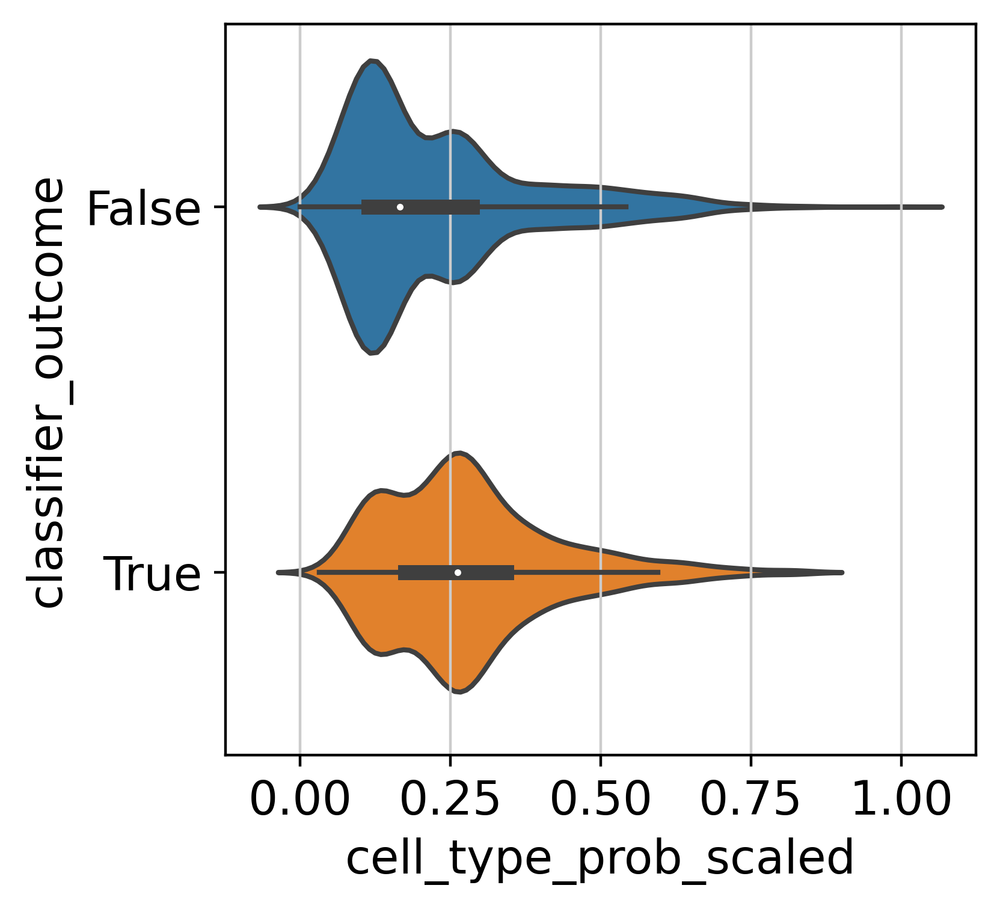

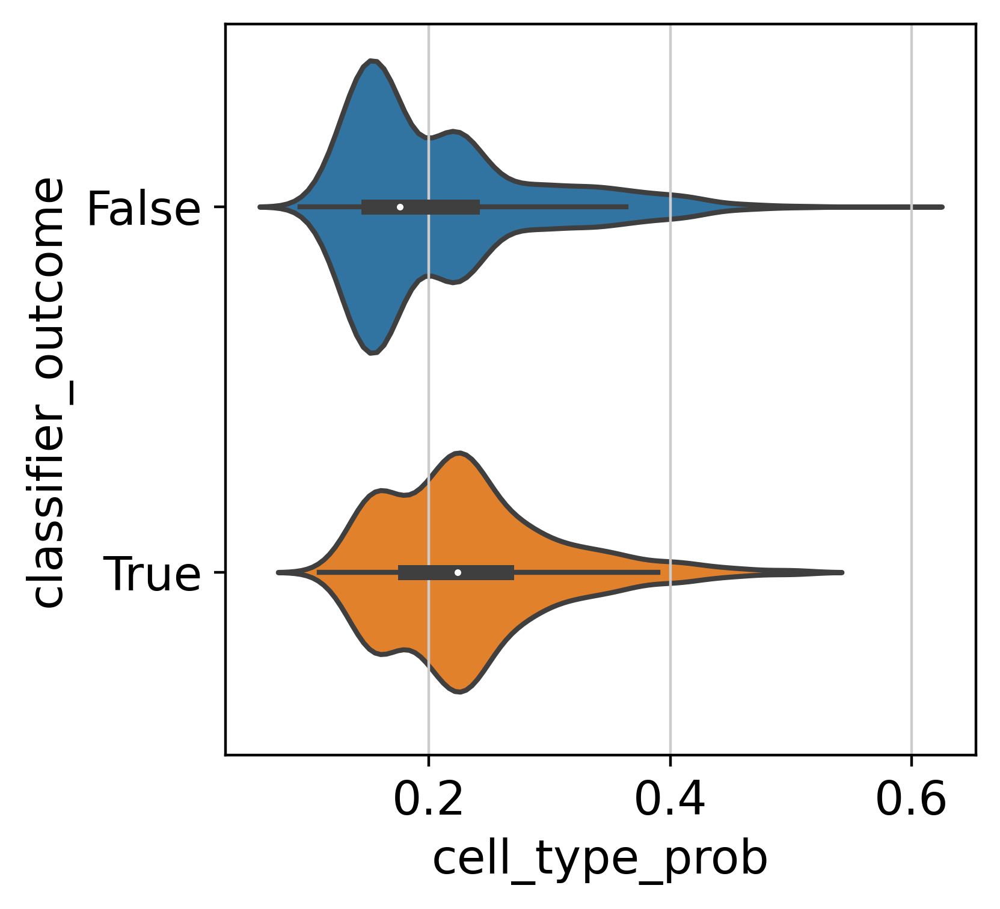

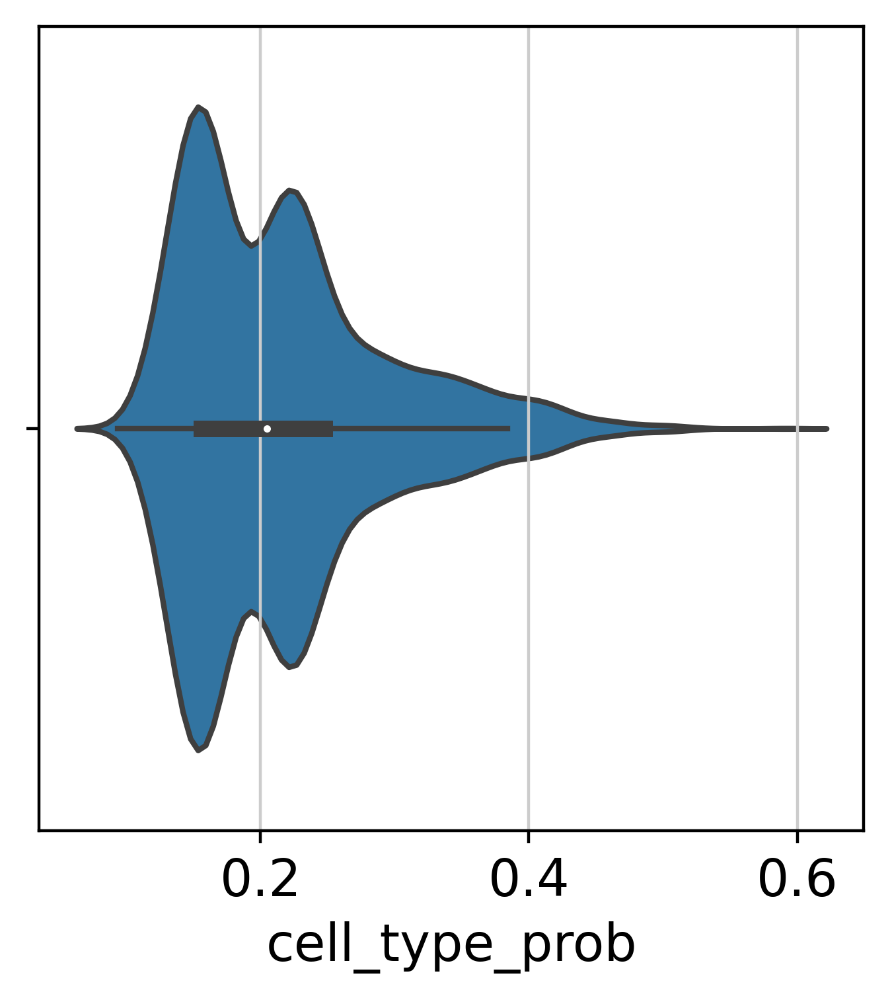

In [198]:
results_dict_q = tranvae.classify(
    metric="dist",
    get_prob=True,
    threshold=-1e10
)

preds_q = results_dict_q[cell_type_key]['preds']
print(preds_q)
probs_q = results_dict_q[cell_type_key]['probs']
print(classification_report(
    y_true=query_adata.obs[cell_type_key],
    y_pred=preds_q,
    labels=np.array(query_adata.obs[cell_type_key].unique().tolist())
))
conf_matrix_plot(
    y_true=query_adata.obs[cell_type_key],
    y_pred=preds_q,
    labels=np.array(query_adata.obs[cell_type_key].unique().tolist())
)
data_latent = tranvae.get_latent()
adata_latent = sc.AnnData(data_latent)
adata_latent.obs[condition_key] = query_adata.obs[condition_key].tolist()
adata_latent.obs[cell_type_key] = query_adata.obs[cell_type_key].tolist()
adata_latent.obs[f'{cell_type_key}_pred'] = preds_q.tolist()
adata_latent.obs[f'{cell_type_key}_prob'] = probs_q.tolist()
adata_latent.obs[f'classifier_outcome'] = (
    adata_latent.obs[f'{cell_type_key}_pred'] == adata_latent.obs[f'{cell_type_key}']
)
probs_scaled = (probs_q - probs_q.min(axis=0)) / (probs_q.max(axis=0) - probs_q.min(axis=0))

adata_latent.obs[f'{cell_type_key}_prob_scaled'] = probs_scaled
plt.figure()
sns.violinplot(
    x=adata_latent.obs['cell_type_prob_scaled'], 
    y=adata_latent.obs['classifier_outcome'].astype('category')
)
plt.figure()
sns.violinplot(
    x=adata_latent.obs['cell_type_prob'], 
    y=adata_latent.obs['classifier_outcome'].astype('category')
)
plt.figure()
sns.violinplot(
    x=adata_latent.obs['cell_type_prob'], 
)

(0.0, 1.0)

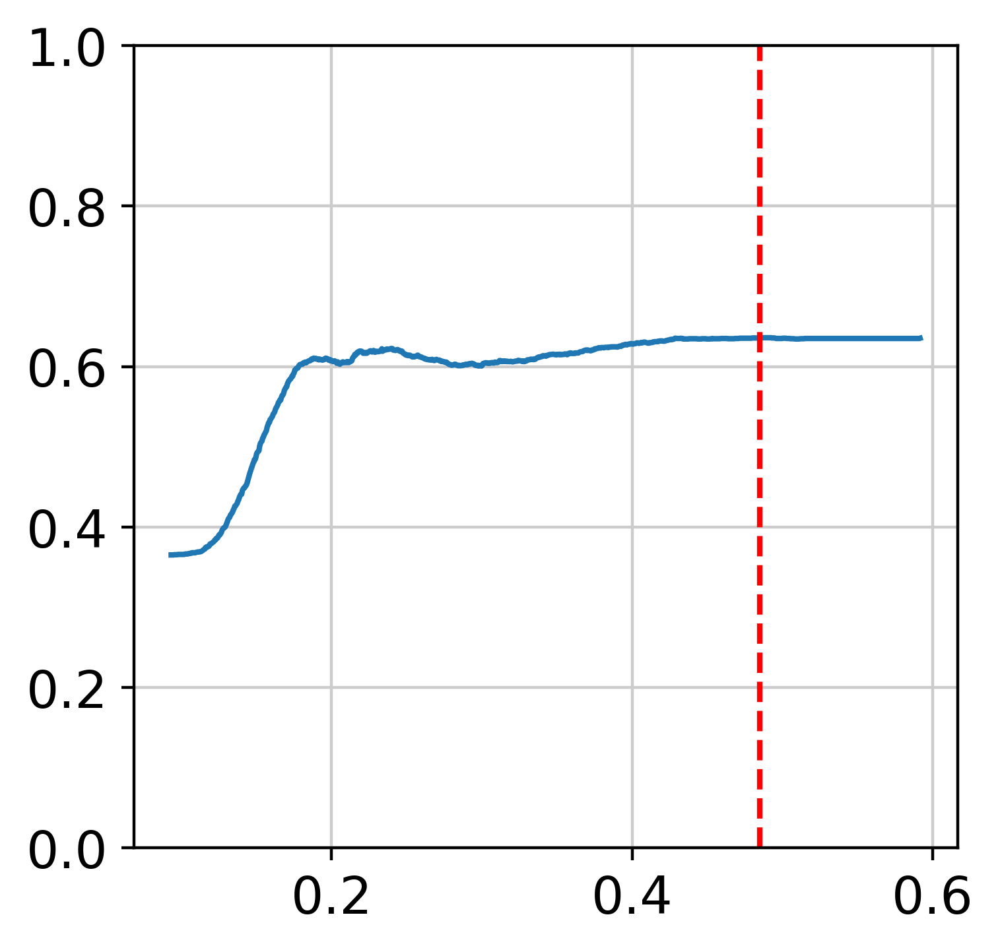

In [199]:
accs, candidates = detect_threshold(adata_latent.obs['cell_type_prob'], adata_latent.obs['classifier_outcome'])
candidates[np.argmax(accs)]
plt.plot(candidates, accs)
plt.axvline(candidates[np.argmax(accs)], color='r', linestyle='--')
plt.ylim([0, 1])

#### Get information for both landmark sets

In [200]:
labeled_set_euclidean = tranvae.get_landmarks_info()
labeled_set_euclidean.obs['condition'] = 'labeled landmark euclidean'

In [201]:
unlabeled_set_euclidean = tranvae.get_landmarks_info(landmark_set='unlabeled')
unlabeled_set_euclidean.obs['condition'] = 'unlabeled landmark euclidean'

#### Create adata object with cell  and landmark informations

In [202]:
data_latent = tranvae.get_latent()
adata_latent = sc.AnnData(data_latent)
adata_latent.obs[condition_key] = query_adata.obs[condition_key].tolist()
adata_latent.obs[cell_type_key] = query_adata.obs[cell_type_key].tolist()
adata_latent.obs[f'{cell_type_key}_pred'] = preds_q.tolist()
adata_latent.obs[f'{cell_type_key}_prob'] = probs_q.tolist()
adata_latent.obs[f'classifier_outcome'] = (
    adata_latent.obs[f'{cell_type_key}_pred'] == adata_latent.obs[f'{cell_type_key}']
)
probs_scaled = (probs_q - probs_q.min(axis=0)) / (probs_q.max(axis=0) - probs_q.min(axis=0))

adata_latent.obs[f'{cell_type_key}_prob_scaled'] = probs_scaled
adata_latent

AnnData object with n_obs × n_vars = 3265 × 10
    obs: 'condition', 'cell_type', 'cell_type_pred', 'cell_type_prob', 'classifier_outcome', 'cell_type_prob_scaled'

In [203]:
full_latent = adata_latent.concatenate([
    labeled_set_euclidean, 
    unlabeled_set_euclidean,
])
full_latent.obs['classifier_outcome'] = full_latent.obs['classifier_outcome'].astype('category')

#### Visualize Combined adata object

In [204]:
sc.pp.pca(full_latent)
sc.pp.neighbors(full_latent, n_neighbors=8)
sc.tl.leiden(full_latent)
sc.tl.umap(full_latent)

/home/icb/carlo.dedonno/anaconda3/envs/lataq_cuda/lib/python3.8/site-packages/anndata/_core/anndata.py:1228: ImplicitModificationWarning: Initializing view as actual.
  warnings.warn(
Trying to set attribute `.obs` of view, copying.
... storing 'condition' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'cell_type' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'cell_type_pred' as categorical


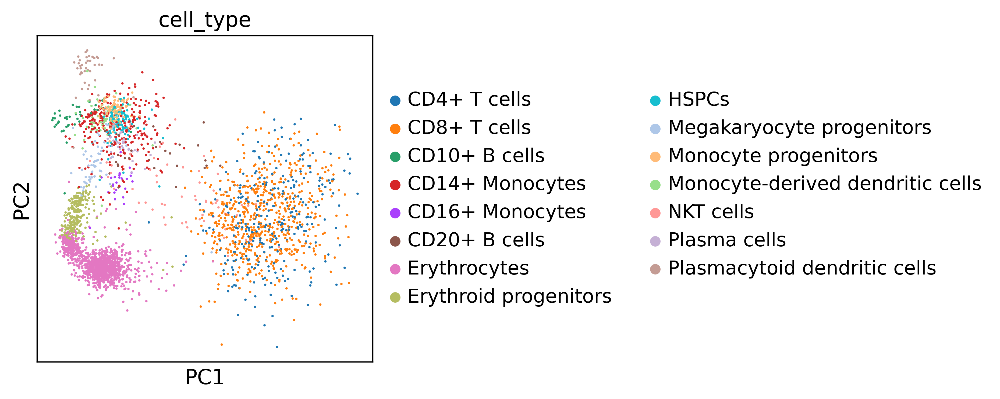

In [205]:
landmark_keys = [
    "labeled landmark euclidean",
    "unlabeled landmark euclidean"
]
sc.pl.pca(
    full_latent[~full_latent.obs[condition_key].isin(landmark_keys)],
    size=10,
    color=[cell_type_key],
)

/home/icb/carlo.dedonno/anaconda3/envs/lataq_cuda/lib/python3.8/site-packages/anndata/_core/anndata.py:1228: ImplicitModificationWarning: Initializing view as actual.
  warnings.warn(
Trying to set attribute `.obs` of view, copying.
... storing 'condition' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'cell_type' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'cell_type_pred' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'condition' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'cell_type' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'cell_type_pred' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'condition' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'cell_type' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'cell_type_pred' as categorical
Trying to

cell_type
cell_type_pred
cell_type_prob
classifier_outcome


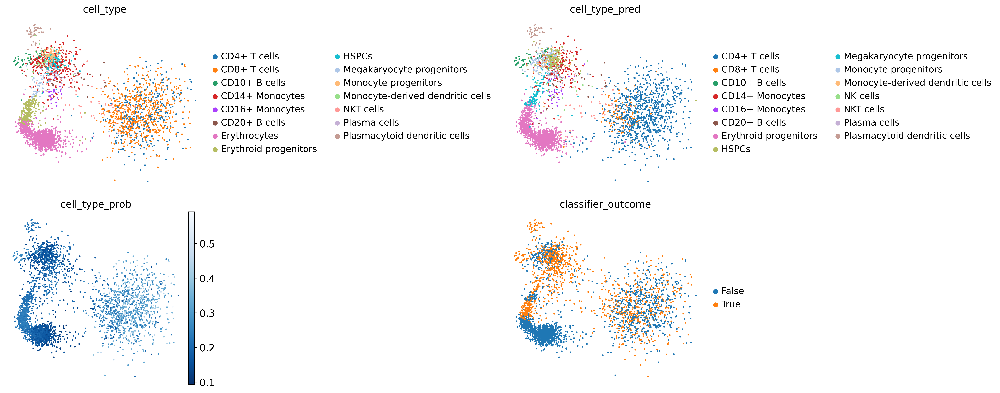

In [206]:
fig, ax = plt.subplots(2, 2, figsize=(20, 8))
ax = ax.flatten()
plot_keys = [
    'cell_type', 
    'cell_type_pred',
    'cell_type_prob',
    'classifier_outcome'
]
sc.pp.pca(full_latent)
for i, key in enumerate(plot_keys):
    print(key)
    cmap = None
    if i > 1:
        cmap='Blues_r'
    sc.pl.pca(
        full_latent[~full_latent.obs[condition_key].isin(landmark_keys)], 
        color=key,
        size=20,
        show=False, 
        ax=ax[i],
        frameon=False,
        cmap=cmap
    )
    ax[i].set_title(key)
fig.tight_layout()

... storing 'condition' as categorical
... storing 'cell_type' as categorical
... storing 'cell_type_pred' as categorical
Trying to set attribute `.uns` of view, copying.
Trying to set attribute `.uns` of view, copying.


labeled landmark euclidean
unlabeled landmark euclidean


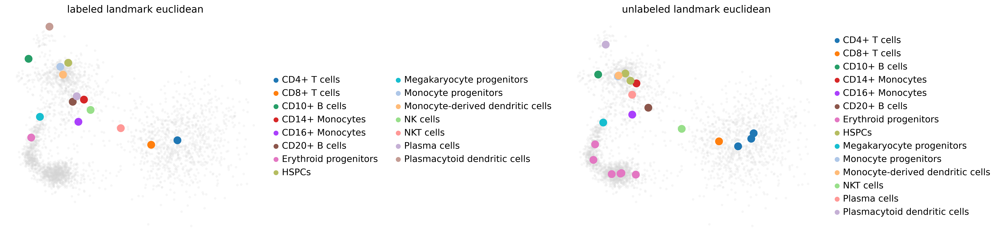

In [207]:
fig, ax = plt.subplots(1, 2, figsize=(20, 5))
ax = ax.flatten()
sc.pp.pca(full_latent)
for i, key in enumerate(landmark_keys):
    print(key)
    sc.pl.pca(
        full_latent, 
        #color=cell_type_key,
        size=50,
        alpha=0.2, 
        show=False, 
        ax=ax[i]
    )
    ax[i].legend([])
    sc.pl.pca(
        full_latent[full_latent.obs[condition_key] == key],
        size=500,
        color=[cell_type_key + '_pred'],
        ax=ax[i],
        show=False,
        frameon=False,
    )
    ax[i].set_title(key)
fig.tight_layout()

Trying to set attribute `.uns` of view, copying.


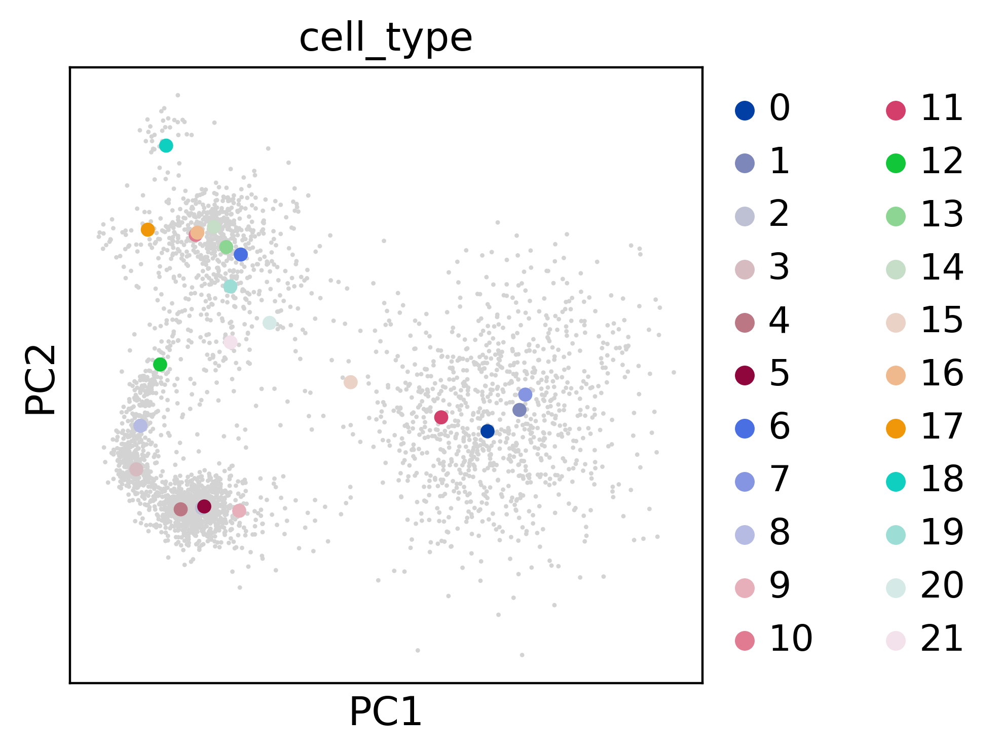

In [208]:
ax = sc.pl.pca(full_latent, size=10, show=False)
sc.pl.pca(
    full_latent[full_latent.obs[condition_key] == "unlabeled landmark euclidean"],
    size=100,
    color=[cell_type_key],
    ax=ax
)

# Unseen cell type detection

#### Check for novel cell types

/home/icb/carlo.dedonno/anaconda3/envs/lataq_cuda/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


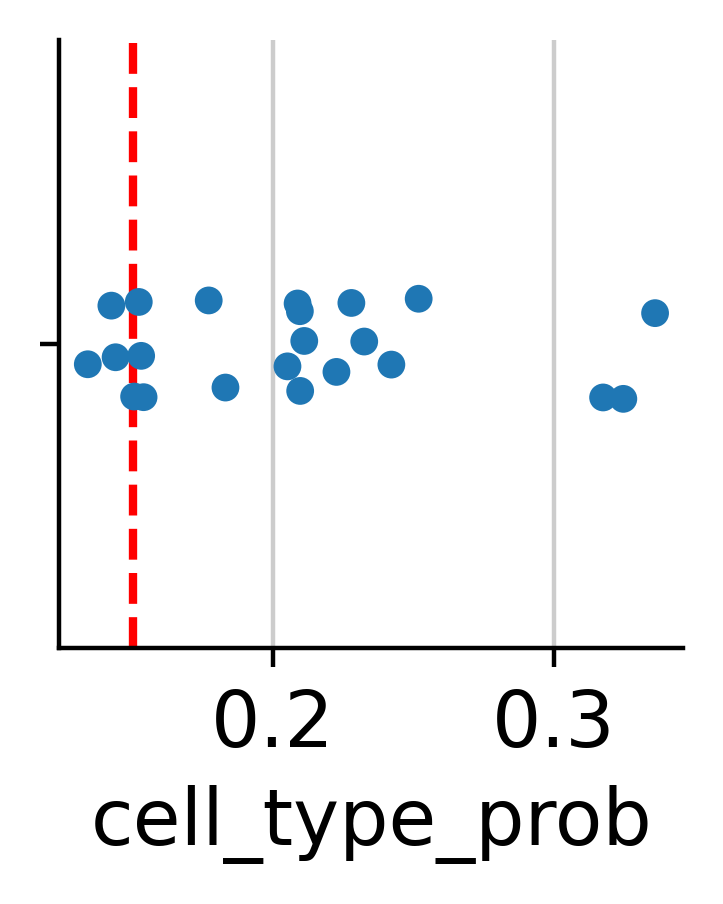

In [209]:
unlabeled_set_euclidean.obs['cell_type_prob']
fig, ax = plt.subplots(1, 1, figsize=(2, 2))
sns.stripplot(
    unlabeled_set_euclidean.obs['cell_type_prob'],
    ax=ax
)
ax.axvline(0.15, color='r', linestyle="--")
sns.despine()

In [225]:
unlabeled_set_euclidean.obs['novel'] = (unlabeled_set_euclidean.obs['cell_type_prob'] < 0.15).astype('category')

In [226]:
full_latent = adata_latent.concatenate([
    labeled_set_euclidean, 
    unlabeled_set_euclidean,
])
full_latent

AnnData object with n_obs × n_vars = 3302 × 10
    obs: 'condition', 'cell_type', 'classifier_outcome', 'cell_type_pred', 'cell_type_prob', 'novel', 'batch'

... storing 'condition' as categorical
... storing 'cell_type' as categorical
... storing 'cell_type_pred' as categorical
Trying to set attribute `.uns` of view, copying.


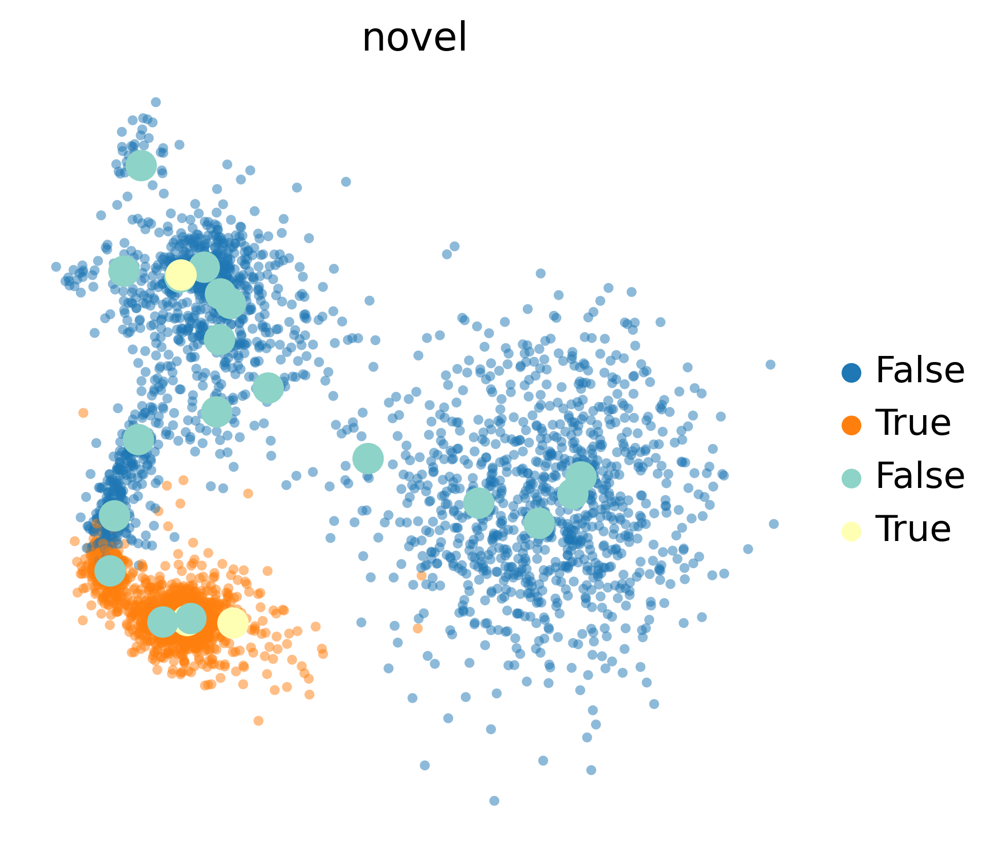

In [227]:
sc.pp.pca(full_latent)
full_latent.obs['is_novel'] = (full_latent.obs[cell_type_key] == 'Erythrocytes').astype('category')
full_latent.obs['novel'] = (full_latent.obs['novel']).astype('category')

fig, ax = plt.subplots(1, 1, figsize=(5, 5))
sc.pl.pca(full_latent, size=50, ax=ax, show=False, color='is_novel', alpha=0.5)
sc.pl.pca(
    full_latent[full_latent.obs[condition_key] == "unlabeled landmark euclidean"],
    size=500,
    color=['novel'],
    palette=sns.color_palette("Set3", 2),
    ax=ax,
    frameon=False
)

In [228]:
#check = np.array(unlabeled_set_euclidean.obs[unlabeled_set_euclidean.obs['cell_type_prob']<0.2].index).astype(int)
check = np.array([2, 5, 9])
check_shifted = check + len(adata_latent) + len(labeled_set_euclidean)

Trying to set attribute `.uns` of view, copying.


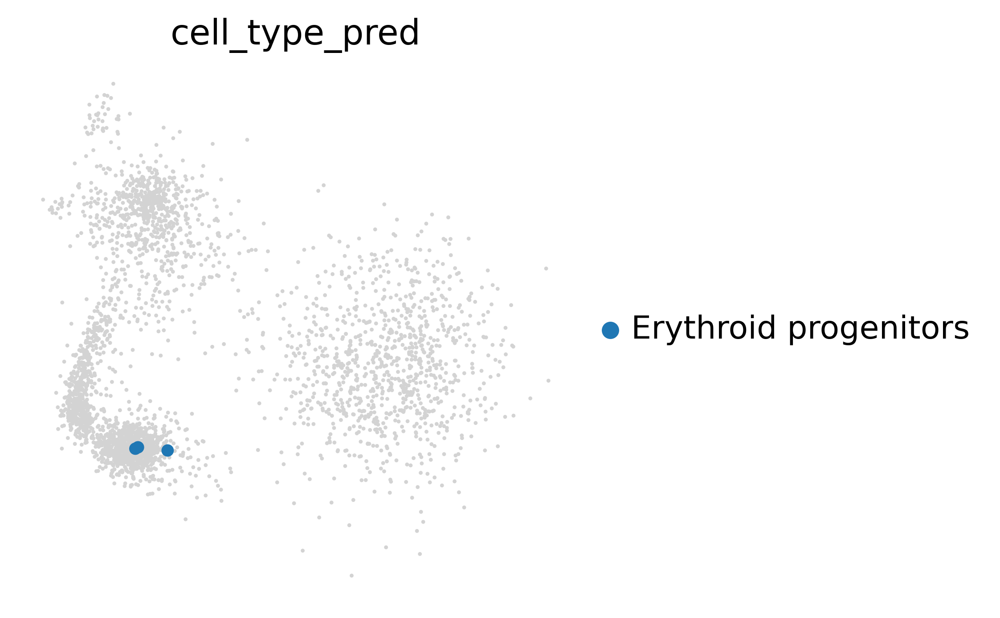

In [229]:
ax = sc.pl.pca(full_latent, size=10, show=False)

sc.pl.pca(
    full_latent[check_shifted],
    size=100,
    color=[cell_type_key + '_pred'],
    ax=ax,
    frameon=False
)

#### Add novel cell type with corresponding landmark(s) to the model

In [230]:
tranvae.add_new_cell_type(
    "Erythrocytes", 
    cell_type_key, 
    check.tolist()
)

# Visualize results with updated model

                                  precision    recall  f1-score   support

                    CD8+ T cells       0.98      0.16      0.27       639
                    CD4+ T cells       0.34      0.97      0.51       295
                    Erythrocytes       0.99      0.78      0.87      1219
       Megakaryocyte progenitors       0.42      0.72      0.53        71
    Plasmacytoid dendritic cells       0.86      0.90      0.88        41
                   CD20+ B cells       0.90      0.87      0.89        31
                   CD10+ B cells       0.85      0.98      0.91        41
           Erythroid progenitors       0.41      0.75      0.53       249
                 CD14+ Monocytes       1.00      0.59      0.74       263
                       NKT cells       0.87      0.55      0.67        62
                           HSPCs       0.57      0.92      0.71       119
                    Plasma cells       1.00      1.00      1.00        40
            Monocyte progenitors     

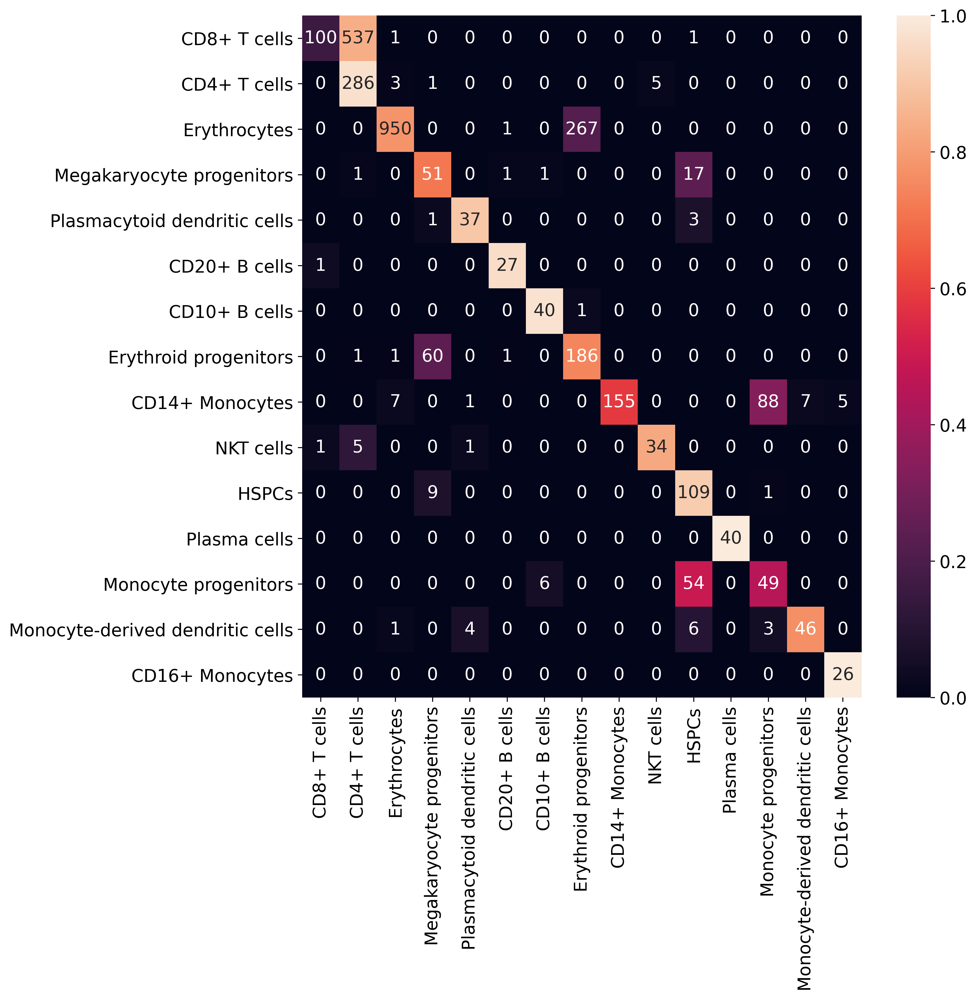

In [231]:
results_dict = tranvae.classify(
)

preds = results_dict[cell_type_key]['preds']
probs = results_dict[cell_type_key]['probs']
print(classification_report(
    y_true=query_adata.obs[cell_type_key],
    y_pred=preds,
    labels=np.array(query_adata.obs[cell_type_key].unique().tolist())
))
conf_matrix_plot(
    y_true=query_adata.obs[cell_type_key],
    y_pred=preds,
    labels=np.array(query_adata.obs[cell_type_key].unique().tolist())
)

In [232]:
labeled_set = tranvae.get_landmarks_info(
)
unlabeled_set = tranvae.get_landmarks_info(
    landmark_set='unlabeled',
)
labeled_set

AnnData object with n_obs × n_vars = 16 × 10
    obs: 'condition', 'cell_type', 'cell_type_pred', 'cell_type_prob'

['CD4+ T cells' 'CD4+ T cells' 'CD4+ T cells' 'CD4+ T cells'
 'CD4+ T cells' 'CD4+ T cells' 'Erythrocytes' ... 'CD16+ Monocytes'
 'Erythrocytes' 'Erythrocytes' 'Erythroid progenitors' 'CD4+ T cells'
 'CD14+ Monocytes' 'Erythrocytes']
                                  precision    recall  f1-score   support

                    CD8+ T cells       0.99      0.14      0.25       639
                    CD4+ T cells       0.34      0.98      0.51       295
                    Erythrocytes       0.99      0.78      0.87      1219
       Megakaryocyte progenitors       0.42      0.73      0.54        71
    Plasmacytoid dendritic cells       0.86      0.93      0.89        41
                   CD20+ B cells       0.83      0.97      0.90        31
                   CD10+ B cells       0.85      0.95      0.90        41
           Erythroid progenitors       0.41      0.76      0.53       249
                 CD14+ Monocytes       0.99      0.62      0.77       263
                       NK

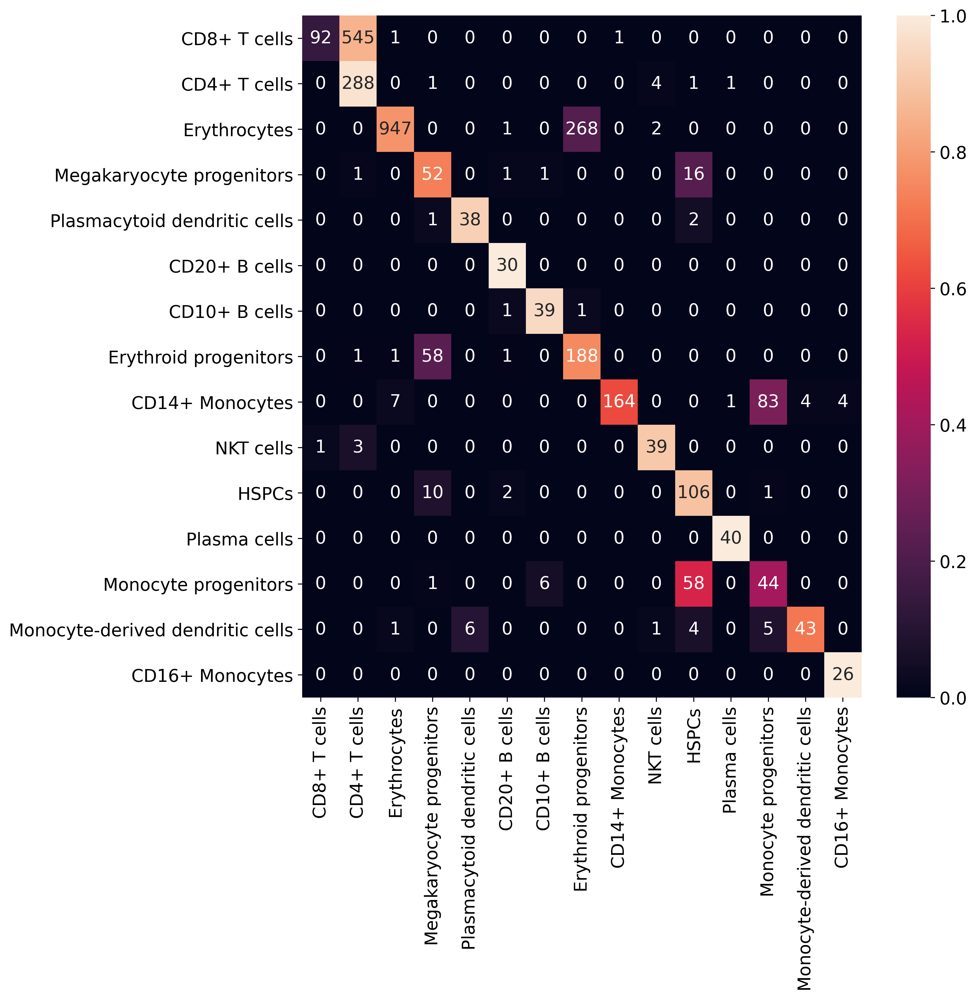

In [239]:
results_dict_q = tranvae.classify(
    metric="dist",
    get_prob=True,
    threshold=-1e10
)

preds_q = results_dict_q[cell_type_key]['preds']
print(preds_q)
probs_q = results_dict_q[cell_type_key]['probs']
print(classification_report(
    y_true=query_adata.obs[cell_type_key],
    y_pred=preds_q,
    labels=np.array(query_adata.obs[cell_type_key].unique().tolist())
))
conf_matrix_plot(
    y_true=query_adata.obs[cell_type_key],
    y_pred=preds_q,
    labels=np.array(query_adata.obs[cell_type_key].unique().tolist())
)
data_latent = tranvae.get_latent()
adata_latent = sc.AnnData(data_latent)
adata_latent.obs[condition_key] = query_adata.obs[condition_key].tolist()
adata_latent.obs[cell_type_key] = query_adata.obs[cell_type_key].tolist()
adata_latent.obs[f'{cell_type_key}_pred'] = preds_q.tolist()
adata_latent.obs[f'{cell_type_key}_prob'] = probs_q.tolist()
adata_latent.obs[f'classifier_outcome'] = (
    adata_latent.obs[f'{cell_type_key}_pred'] == adata_latent.obs[f'{cell_type_key}']
).astype('category')

In [242]:
sc.pp.pca(adata_latent)

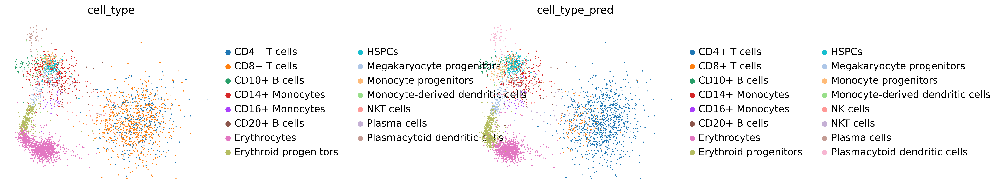

<Figure size 800x800 with 0 Axes>

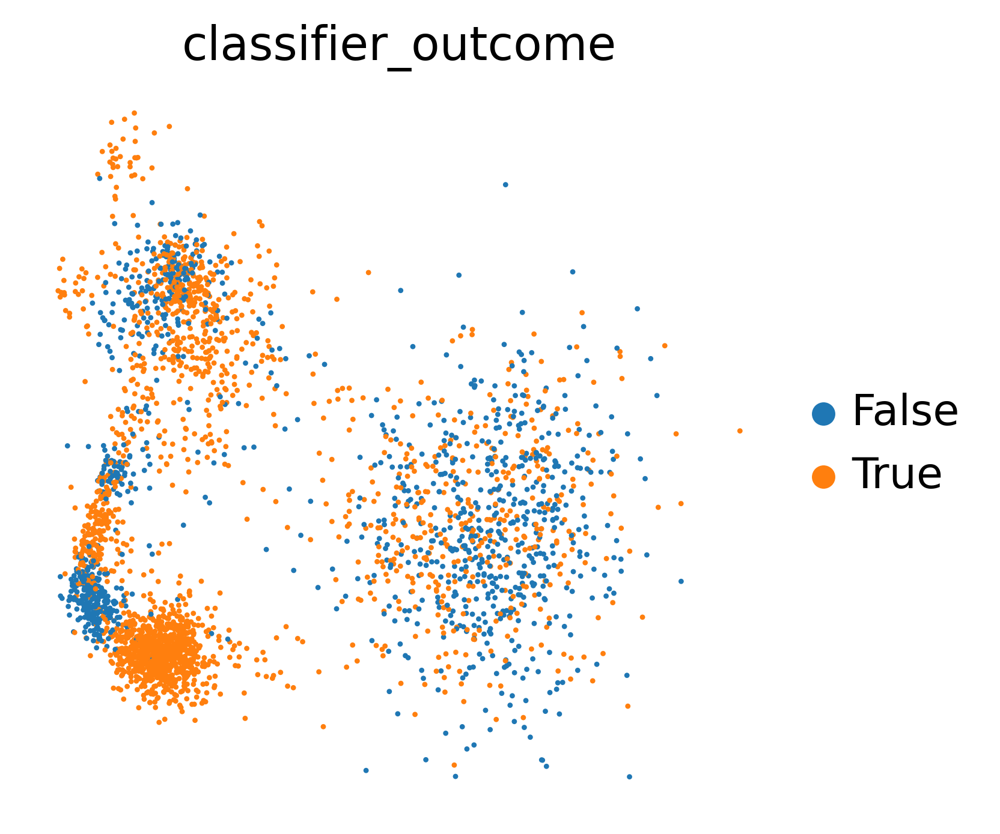

In [243]:
landmark_keys = ["Landmark-Set Unlabeled","Landmark-Set Labeled"]
sc.pl.pca(
    adata_latent,
    wspace=1,
    size=10,
    color=[cell_type_key, 'cell_type_pred'],
    frameon=False
)
plt.figure()
sc.pl.pca(
    adata_latent,
    size=10,
    color=['classifier_outcome'],
    frameon=False
)

... storing 'condition' as categorical
... storing 'cell_type' as categorical
... storing 'cell_type_pred' as categorical
Trying to set attribute `.uns` of view, copying.


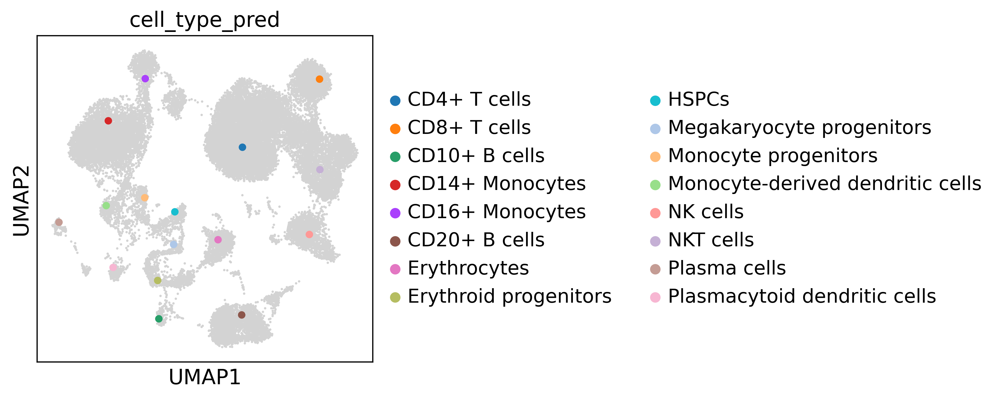

In [72]:
ax = sc.pl.umap(full_latent, size=10, show=False)
sc.pl.umap(
    full_latent[full_latent.obs[condition_key] == "Landmark-Set Labeled"],
    size=100,
    color=[cell_type_key + '_pred'],
    ax=ax
)